In [ ]:
pip install diffusers --upgrade


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 11.4 MB/s eta 0:00:00


In [ ]:
!pip install invisible_watermark transformers accelerate safetensors


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 261.4/261.4 kB 13.6 MB/s eta 0:00:00


In [ ]:
!pip install sentencepiece

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 8.2 MB/s eta 0:00:00


In [ ]:
from diffusers import DiffusionPipeline
import torch

pipe = DiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16, use_safetensors=True, variant="fp16")
pipe.to("cuda")

# if using torch < 2.0
# pipe.enable_xformers_memory_efficient_attention()

prompt = "An astronaut riding a horse"
images = pipe(prompt=prompt).images[0]


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

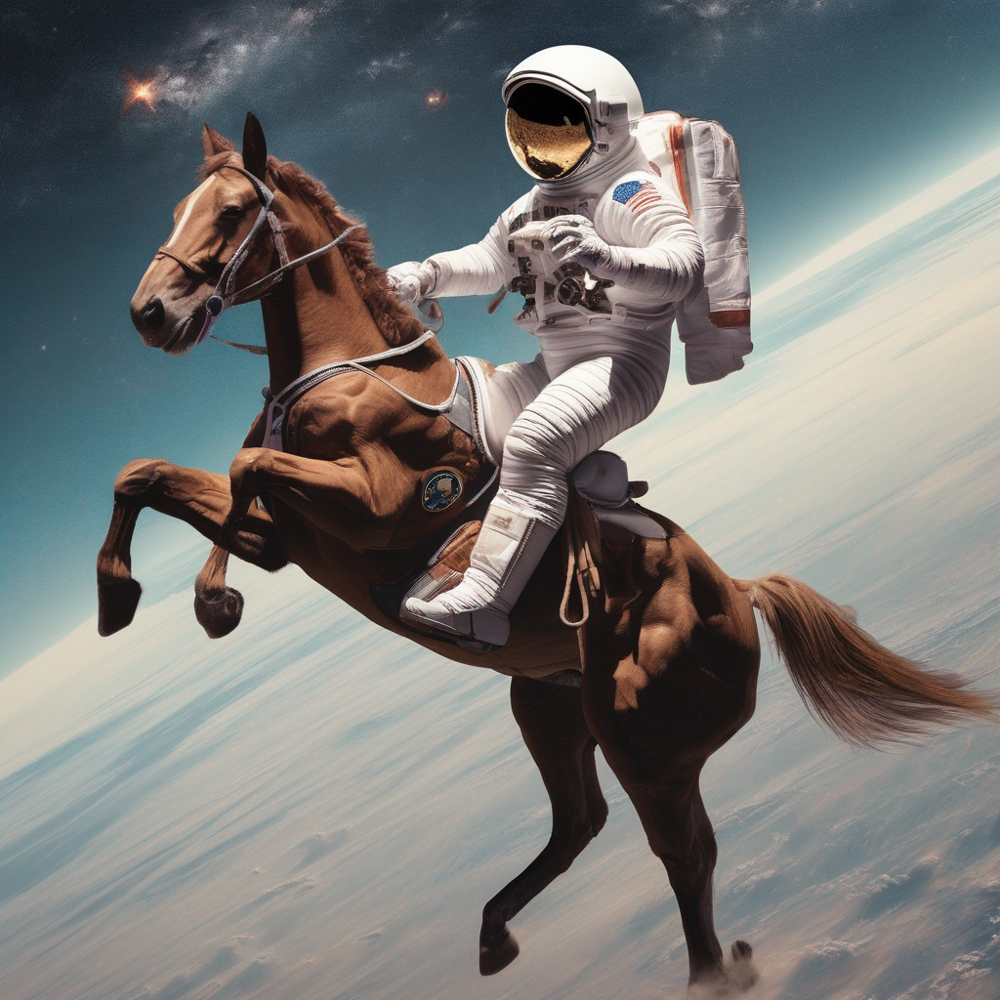

In [ ]:
images

  0%|          | 0/50 [00:00<?, ?it/s]

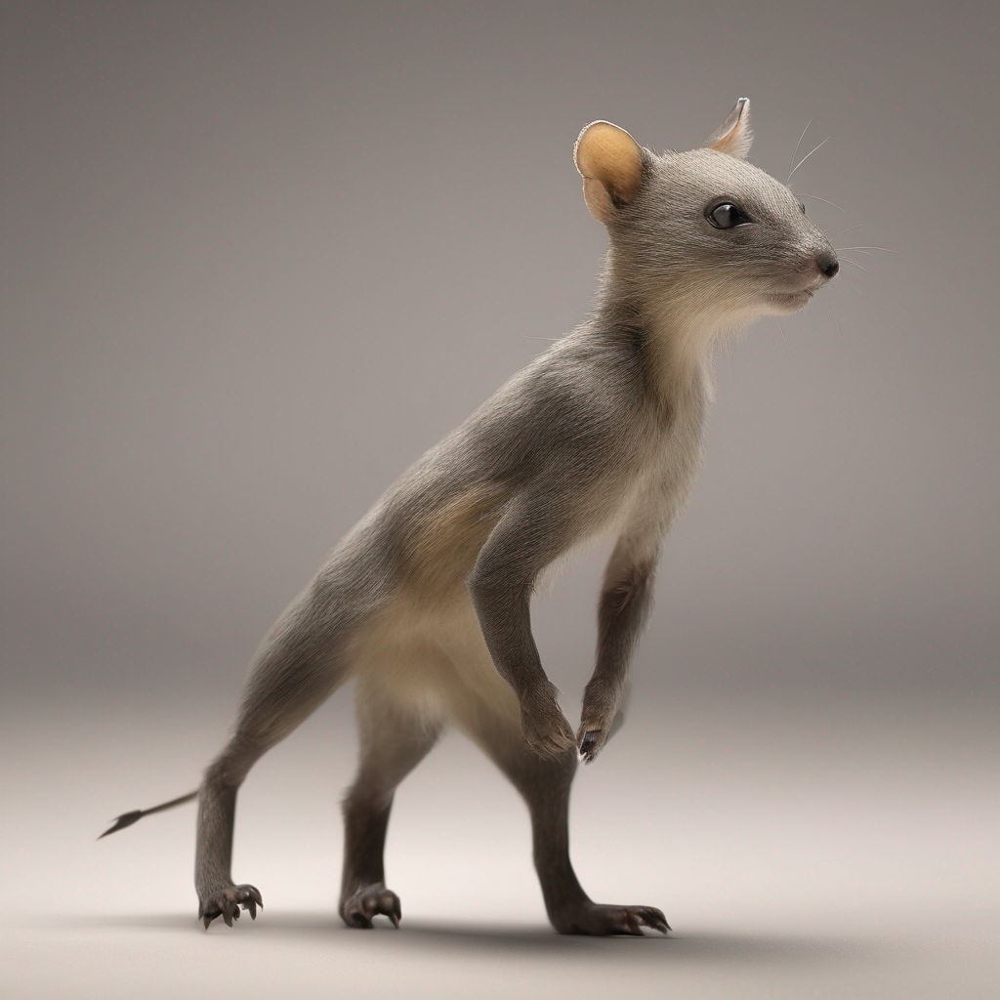

In [ ]:
prompt = "Small four-legged animal with a tail"

images = pipe(prompt=prompt).images[0]

images

In [ ]:
import zipfile
import os

In [ ]:
file = '/content/model.zip'
path = '/content'
with zipfile.ZipFile(file, 'r') as zip_ref:
    zip_ref.extractall(path)


In [ ]:
import pandas as pd
from transformers import T5Tokenizer, T5ForConditionalGeneration
import torch
import re

tokenizer = T5Tokenizer.from_pretrained("/content/model")
model = T5ForConditionalGeneration.from_pretrained("/content/model")

input_descriptions = [
    "A large hunter",
    # Add more descriptions as needed
]

tokenized_inputs = [tokenizer(f"generate name: {desc}", return_tensors="pt") for desc in input_descriptions]

with torch.no_grad():
    outputs = model.generate(**tokenized_inputs[0])

decoded_predictions = tokenizer.decode(outputs[0], skip_special_tokens=True).strip()

print("Generated Tokens:", outputs[0])
print("Decoded Tokens:", decoded_predictions)

print("Generated Animal Name:", decoded_predictions)


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Generated Tokens: tensor([   0, 1546,  122, 6779,    1])
Decoded Tokens: Hogfish
Generated Animal Name: Hogfish


In [ ]:
#With Using the fine-tuned model

  0%|          | 0/50 [00:00<?, ?it/s]

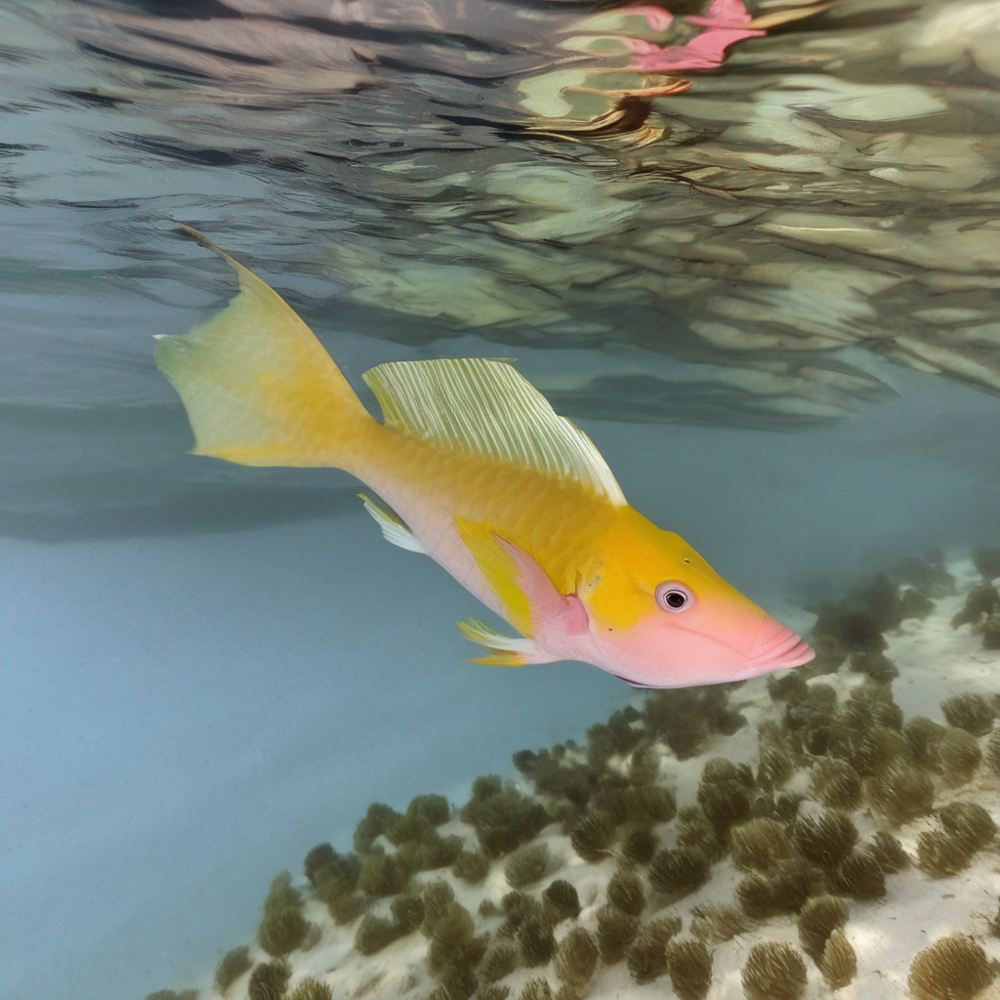

In [ ]:
prompt = decoded_predictions

images = pipe(prompt=prompt).images[0]

images

Without the finetuned model-


  0%|          | 0/50 [00:00<?, ?it/s]

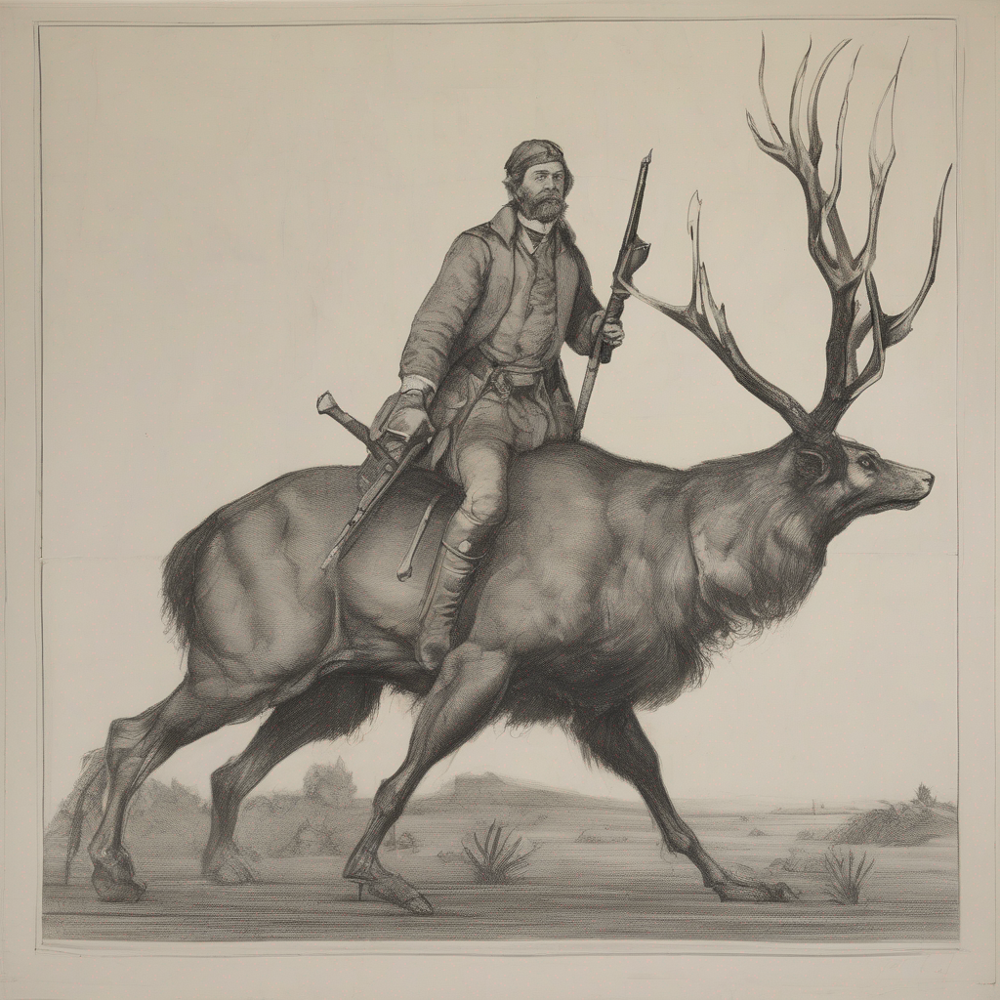

In [ ]:
prompt = "A large hunter"

images = pipe(prompt=prompt).images[0]

images

In [ ]:
input_descriptions = [
    "a medium-sized breed of dog that was originally bred in Canada as a retriever and hunting dog.",

]


tokenized_inputs = [tokenizer(f"generate name: {desc}", return_tensors="pt") for desc in input_descriptions]

with torch.no_grad():
    outputs = model.generate(**tokenized_inputs[0])

decoded_predictions = tokenizer.decode(outputs[0], skip_special_tokens=True).strip()


print("Generated Tokens:", outputs[0])
print("Decoded Tokens:", decoded_predictions)

# Print final result
print("Generated Animal Name:", decoded_predictions)

Generated Tokens: tensor([    0,  4151, 17495,    49,     1])
Decoded Tokens: Canadian Terrier
Generated Animal Name: Canadian Terrier


  0%|          | 0/50 [00:00<?, ?it/s]

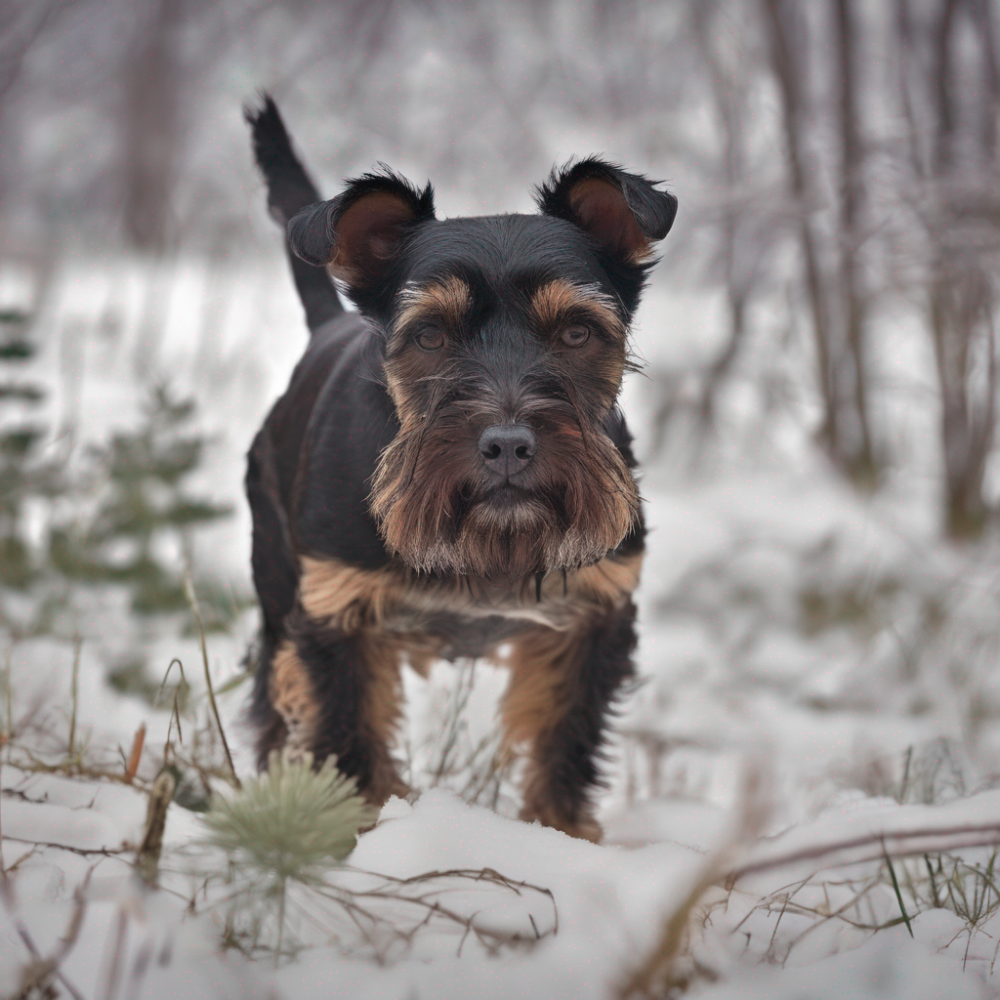

In [ ]:
prompt = decoded_predictions

images = pipe(prompt=prompt).images[0]

images

  0%|          | 0/50 [00:00<?, ?it/s]

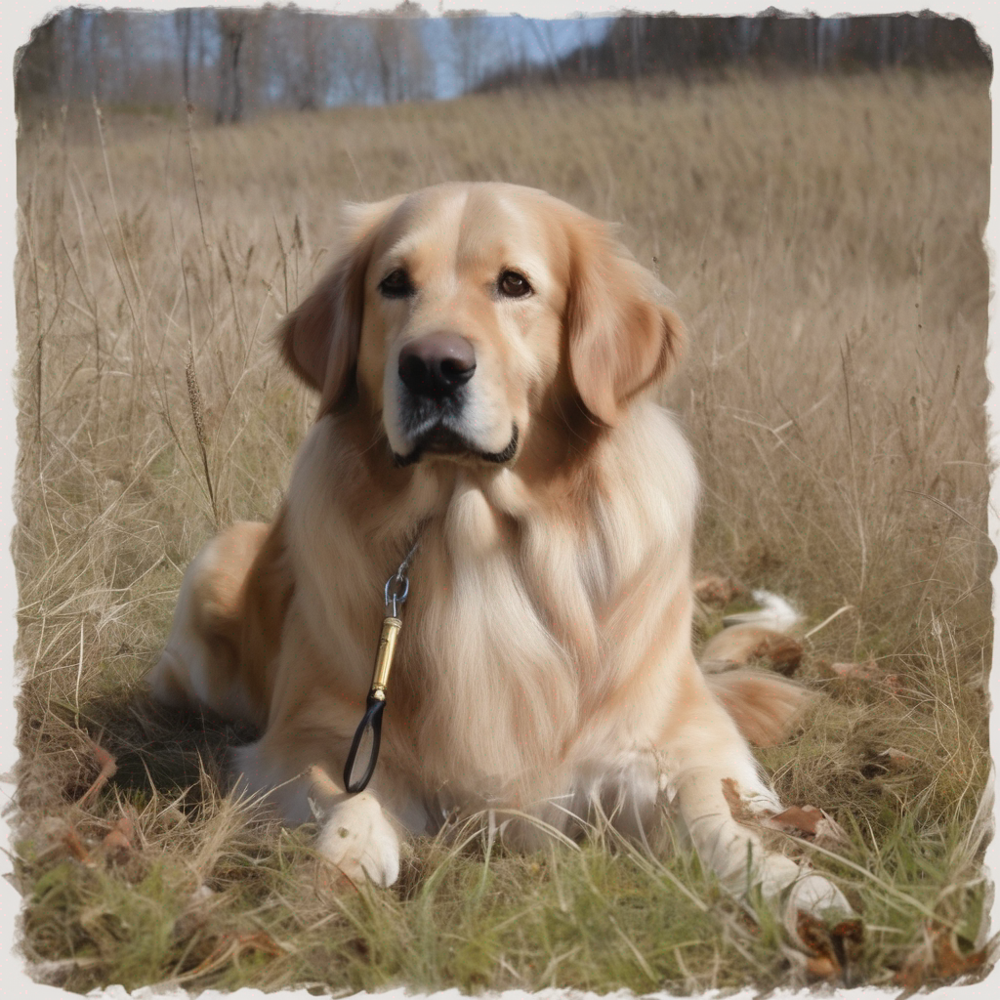

In [ ]:
prompt = "a medium-sized breed of dog that was originally bred in Canada as a retriever and hunting dog"

images = pipe(prompt=prompt).images[0]

images